# 1. Environment Setup & Dependencies

In [7]:
import os
import sys
import subprocess
import warnings
warnings.filterwarnings("ignore")

def install_package(package):
    try:
        __import__(package)
    except ImportError:
        print(f"Installing {package}...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", package, "-q"])

# Install critical libraries
install_package("ultralytics")
install_package("roboflow")
install_package("seaborn")
install_package("segmentation_models_pytorch")
install_package("timm")
install_package("pretrainedmodels")
install_package("efficientnet_pytorch")


# Imports
import cv2
import yaml
import torch
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from ultralytics import YOLO
from roboflow import Roboflow

# Configuration for plots
%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 8)
sns.set_style("darkgrid")

# Hardware Check
print(f"Python: {sys.version.split()[0]}")
print(f"Torch: {torch.__version__}")
if torch.cuda.is_available():
    DEVICE = 0
    print(f"GPU: {torch.cuda.get_device_name(0)}")
else:
    DEVICE = 'cpu'
    print("WARNING: No GPU detected. Training will be extremely slow.")

Python: 3.12.0
Torch: 2.5.1+cu121
GPU: NVIDIA GeForce RTX 3050 Laptop GPU


# 2. Configuration & Reproducibility

In [8]:
class Config:
    # Roboflow Credentials (extracted from your notebook)
    API_KEY = "TEoE9TIzrU3jvIMDdYys"
    WORKSPACE = "blue-halo"
    PROJECT = "vegetation-segmentation"
    VERSION = 4

    # Model Settings
    TASK = "segment"       # 'detect' for boxes, 'segment' for polygons
    MODEL_SIZE = "l-seg"   # l-seg (large segmentation) Use s-seg or m-seg for higher accuracy.
    IMG_SIZE = 640

    # Training Hyperparameters
    EPOCHS = 30
    BATCH_SIZE = 16
    OPTIMIZER = 'auto'
    SEED = 42

    # Directories
    ROOT_DIR = os.getcwd()
    DATASET_DIR = os.path.join(ROOT_DIR, "vegetation-segmentation-4")

def seed_everything(seed=42):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

seed_everything(Config.SEED)
print("Configuration established. Random seeds locked.")

Configuration established. Random seeds locked.


#  3. Data Acquisition

In [10]:

if not os.path.exists(Config.DATASET_DIR):
    print(f"Downloading {Config.PROJECT} dataset (Version {Config.VERSION})...")
    rf = Roboflow(api_key=Config.API_KEY)
    project = rf.workspace(Config.WORKSPACE).project(Config.PROJECT)
    version = project.version(Config.VERSION)
    # Important: Download in yolov8 format which supports segmentation
    dataset = version.download("yolov8")
else:
    print(f"Dataset already exists at {Config.DATASET_DIR}")

# Validation: Check for data.yaml
yaml_path = os.path.join(Config.DATASET_DIR, "data.yaml")
if not os.path.exists(yaml_path):
    # Automatic fix if folder structure is nested
    potential_yaml = list(Path(Config.DATASET_DIR).rglob("data.yaml"))
    if potential_yaml:
        yaml_path = str(potential_yaml[0])
        print(f"Fixed YAML path: {yaml_path}")
    else:
        raise FileNotFoundError("data.yaml not found. Download might have failed.")

print(f"Dataset ready. Config file: {yaml_path}")


Dataset already exists at c:\Users\debas\Videos\Infosys Springboard Internship Project\vegetation-segmentation-4
Dataset ready. Config file: c:\Users\debas\Videos\Infosys Springboard Internship Project\vegetation-segmentation-4\data.yaml


# 4. Exploratory Data Analysis (Segmentation)

Detected Classes: ['vegetation']


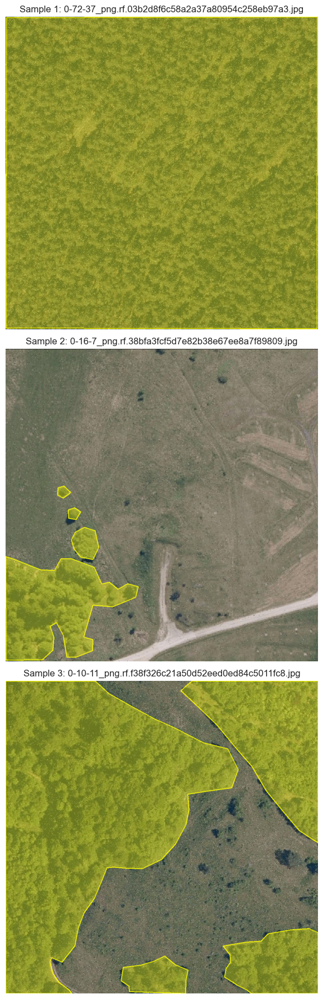

In [11]:
def parse_yaml_classes(yaml_file):
    with open(yaml_file, 'r') as f:
        d = yaml.safe_load(f)
    return d['names']

class_names = parse_yaml_classes(yaml_path)
print(f"Detected Classes: {class_names}")

def visualize_segmentation_sample(image_dir, label_dir, class_names, num_samples=3):
    image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
    if not image_files:
        print("No images found to visualize.")
        return

    samples = random.sample(image_files, min(len(image_files), num_samples))

    plt.figure(figsize=(20, 6 * num_samples))

    for i, img_file in enumerate(samples):
        # Load Image
        img_path = os.path.join(image_dir, img_file)
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h, w, _ = image.shape

        # Create a mask overlay
        overlay = image.copy()

        # Load Label
        label_file = img_file.rsplit('.', 1)[0] + ".txt"
        label_path = os.path.join(label_dir, label_file)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()

            for line in lines:
                data = list(map(float, line.strip().split()))
                class_id = int(data[0])
                # YOLO Seg format: class x1 y1 x2 y2 ... xn yn (normalized)
                coords = data[1:]

                # Reshape to (N, 1, 2) for cv2.polylines
                points = []
                for j in range(0, len(coords), 2):
                    px = int(coords[j] * w)
                    py = int(coords[j+1] * h)
                    points.append([px, py])

                pts = np.array(points, np.int32)
                pts = pts.reshape((-1, 1, 2))

                # Color based on class ID (Golden/Green colors for vegetation)
                color = [(255, 255, 0), (0, 255, 0), (0, 255, 255)][class_id % 3]

                # Draw filled polygon
                cv2.fillPoly(overlay, [pts], color)

                # Draw contours
                cv2.polylines(image, [pts], True, color, 2)

        # Blend overlay with original image
        alpha = 0.4
        image_with_masks = cv2.addWeighted(overlay, alpha, image, 1 - alpha, 0)

        plt.subplot(num_samples, 1, i + 1)
        plt.imshow(image_with_masks)
        plt.axis('off')
        plt.title(f"Sample {i+1}: {img_file}")

    plt.tight_layout()
    plt.show()

# Run Visualization on Train Set
train_img_dir = os.path.join(Config.DATASET_DIR, "train", "images")
train_lbl_dir = os.path.join(Config.DATASET_DIR, "train", "labels")
visualize_segmentation_sample(train_img_dir, train_lbl_dir, class_names)

#  5. Model Training

In [12]:
import os
import cv2
import torch
import torch.nn as nn
import numpy as np
import segmentation_models_pytorch as smp
from torch.utils.data import Dataset, DataLoader
from torch.cuda.amp import GradScaler, autocast
from tqdm.notebook import tqdm

# --- 1. The Dataset Class (Fixes the NameError) ---
class YOLOSegDataset(Dataset):
    def __init__(self, img_dir, label_dir, classes, img_size=320):
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.classes = classes
        self.img_size = img_size
        self.image_files = sorted([f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.png', '.jpeg'))])

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        # Load Image
        img_name = self.image_files[idx]
        img_path = os.path.join(self.img_dir, img_name)
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h, w = image.shape[:2]

        # Create Mask
        mask = np.zeros((h, w), dtype=np.float32)
        label_file = img_name.rsplit('.', 1)[0] + ".txt"
        label_path = os.path.join(self.label_dir, label_file)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
            for line in lines:
                data = list(map(float, line.strip().split()))
                class_id = int(data[0])
                coords = data[1:]
                points = []
                for j in range(0, len(coords), 2):
                    px = int(coords[j] * w)
                    py = int(coords[j+1] * h)
                    points.append([px, py])
                pts = np.array(points, np.int32).reshape((-1, 1, 2))
                cv2.fillPoly(mask, [pts], class_id + 1.0)

        # Resize & Normalize
        image = cv2.resize(image, (self.img_size, self.img_size))
        mask = cv2.resize(mask, (self.img_size, self.img_size), interpolation=cv2.INTER_NEAREST)

        image = image.astype("float32") / 255.0
        image = np.transpose(image, (2, 0, 1))

        return torch.tensor(image, dtype=torch.float32), torch.tensor(mask, dtype=torch.long)

# --- 2. metrics Helper Class ---
class MetricMonitor:
    def __init__(self):
        self.reset()
    def reset(self):
        self.val = 0
        self.sum = 0
        self.count = 0
        self.avg = 0
    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

# --- 3. Calculation Helper ---
def calculate_iou_dice(pred_mask, true_mask, num_classes):
    pred_mask = pred_mask.view(-1)
    true_mask = true_mask.view(-1)
    iou_list, dice_list = [], []

    for cls in range(num_classes):
        pred_inds = (pred_mask == cls)
        target_inds = (true_mask == cls)
        intersection = (pred_inds & target_inds).sum().item()
        union = (pred_inds | target_inds).sum().item()

        if union == 0:
            iou_list.append(1.0)
        else:
            iou_list.append(intersection / union)

        total = pred_inds.sum().item() + target_inds.sum().item()
        if total == 0:
            dice_list.append(1.0)
        else:
            dice_list.append(2 * intersection / total)

    return np.mean(iou_list), np.mean(dice_list)

# --- 4. Training Engine ---
def train_epoch(model, loader, optimizer, loss_fn, scaler):
    model.train()
    monitor = MetricMonitor()
    for images, masks in tqdm(loader, desc="  Train", leave=False):
        images, masks = images.to(DEVICE), masks.to(DEVICE)
        optimizer.zero_grad()
        with autocast():
            outputs = model(images)
            loss = loss_fn(outputs, masks)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        monitor.update(loss.item(), images.size(0))
    return monitor.avg

def validate_epoch(model, loader, loss_fn, num_classes):
    model.eval()
    iou_monitor = MetricMonitor()
    dice_monitor = MetricMonitor()
    with torch.no_grad():
        for images, masks in tqdm(loader, desc="  Val", leave=False):
            images, masks = images.to(DEVICE), masks.to(DEVICE)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            iou, dice = calculate_iou_dice(preds, masks, num_classes)
            iou_monitor.update(iou, images.size(0))
            dice_monitor.update(dice, images.size(0))
    return 0.0, iou_monitor.avg, dice_monitor.avg

print("Foundation built: 'YOLOSegDataset'")

Foundation built: 'YOLOSegDataset'


In [13]:
# Model Training Configuration
BATCH_SIZE = 8
IMG_SIZE = 320  # Keep small for faster testing (use 640 for final results)
LR = 0.0005
EPOCHS = 10     # Adjust as needed

# Define Paths
train_img = os.path.join(Config.DATASET_DIR, "train", "images")
train_lbl = os.path.join(Config.DATASET_DIR, "train", "labels")
valid_img = os.path.join(Config.DATASET_DIR, "valid", "images")
valid_lbl = os.path.join(Config.DATASET_DIR, "valid", "labels")

# Initialize Datasets
n_classes = len(class_names) + 1 # +1 for background
train_ds = YOLOSegDataset(train_img, train_lbl, class_names, img_size=IMG_SIZE)
valid_ds = YOLOSegDataset(valid_img, valid_lbl, class_names, img_size=IMG_SIZE)

# Initialize Loaders
# Set drop_last=True to avoid batches with a single image, which can cause BatchNorm errors
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, drop_last=True)
valid_loader = DataLoader(valid_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=0, drop_last=True)

print(f"Data ready. Classes: {n_classes} (including background)")

Data ready. Classes: 2 (including background)


In [7]:
# Training U-Net"

# 1. Initialize U-Net
unet_model = smp.Unet(
    encoder_name="resnet34",        # Backbone
    encoder_weights="imagenet",     # Pre-trained knowledge
    in_channels=3,
    classes=n_classes
)
unet_model.to(DEVICE)

# 2. Setup Optimizer & Loss
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(unet_model.parameters(), lr=LR)
scaler = GradScaler()

# 3. Training Loop for U-Net
unet_best_iou = 0.0
unet_history = {'train_loss': [], 'val_iou': []}

for epoch in range(EPOCHS):
    # Train
    t_loss = train_epoch(unet_model, train_loader, optimizer, loss_fn, scaler)

    # Validate
    v_loss, v_iou, v_dice = validate_epoch(unet_model, valid_loader, loss_fn, n_classes)

    # Record
    unet_history['train_loss'].append(t_loss)
    unet_history['val_iou'].append(v_iou)

    print(f"U-Net Epoch {epoch+1}/{EPOCHS} | Train Loss: {t_loss:.4f} | Val IoU: {v_iou:.4f}")

    # Save Best U-Net
    if v_iou > unet_best_iou:
        unet_best_iou = v_iou
        torch.save(unet_model.state_dict(), "best_unet.pth")
        print(f"--> Best U-Net Saved! (IoU: {v_iou:.4f})")

print(f"\nFinal U-Net Best IoU: {unet_best_iou:.4f}")

config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

U-Net Epoch 1/10 | Train Loss: 0.3285 | Val IoU: 0.7947
--> Best U-Net Saved! (IoU: 0.7947)


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

U-Net Epoch 2/10 | Train Loss: 0.2514 | Val IoU: 0.8622
--> Best U-Net Saved! (IoU: 0.8622)


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

U-Net Epoch 3/10 | Train Loss: 0.2487 | Val IoU: 0.8827
--> Best U-Net Saved! (IoU: 0.8827)


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

U-Net Epoch 4/10 | Train Loss: 0.2084 | Val IoU: 0.8779


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

U-Net Epoch 5/10 | Train Loss: 0.1774 | Val IoU: 0.8273


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

U-Net Epoch 6/10 | Train Loss: 0.2037 | Val IoU: 0.8823


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

U-Net Epoch 7/10 | Train Loss: 0.1543 | Val IoU: 0.8963
--> Best U-Net Saved! (IoU: 0.8963)


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

U-Net Epoch 8/10 | Train Loss: 0.1922 | Val IoU: 0.8716


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

U-Net Epoch 9/10 | Train Loss: 0.1532 | Val IoU: 0.8916


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

U-Net Epoch 10/10 | Train Loss: 0.1351 | Val IoU: 0.3315

Final U-Net Best IoU: 0.8963


In [ ]:
# Training DeepLabV3+

# 1. Initialize DeepLabV3+
deeplab_model = smp.DeepLabV3Plus(
    encoder_name="resnet34",        # Same backbone for fair comparison
    encoder_weights="imagenet",
    in_channels=3,
    classes=n_classes
)
deeplab_model.to(DEVICE)

# 2. Setup Optimizer & Loss (Resetting optimizer for new model)
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(deeplab_model.parameters(), lr=LR)
scaler = GradScaler()

# 3. Training Loop for DeepLabV3+
deeplab_best_iou = 0.0
deeplab_history = {'train_loss': [], 'val_iou': []}

for epoch in range(EPOCHS):
    # Train
    t_loss = train_epoch(deeplab_model, train_loader, optimizer, loss_fn, scaler)

    # Validate
    v_loss, v_iou, v_dice = validate_epoch(deeplab_model, valid_loader, loss_fn, n_classes)

    # Record
    deeplab_history['train_loss'].append(t_loss)
    deeplab_history['val_iou'].append(v_iou)

    print(f"DeepLab Epoch {epoch+1}/{EPOCHS} | Train Loss: {t_loss:.4f} | Val IoU: {v_iou:.4f}")

    # Save Best DeepLab
    if v_iou > deeplab_best_iou:
        deeplab_best_iou = v_iou
        torch.save(deeplab_model.state_dict(), "best_deeplab.pth")
        print(f"--> Best DeepLab Saved! (IoU: {v_iou:.4f})")

print(f"\nFinal DeepLab Best IoU: {deeplab_best_iou:.4f}")

  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 1/10 | Train Loss: 0.3019 | Val IoU: 0.8887
--> Best DeepLab Saved! (IoU: 0.8887)


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 2/10 | Train Loss: 0.2607 | Val IoU: 0.8818


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 3/10 | Train Loss: 0.2263 | Val IoU: 0.8553


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 4/10 | Train Loss: 0.2313 | Val IoU: 0.8696


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 5/10 | Train Loss: 0.2168 | Val IoU: 0.8841


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 6/10 | Train Loss: 0.1971 | Val IoU: 0.8396


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 7/10 | Train Loss: 0.2143 | Val IoU: 0.8953
--> Best DeepLab Saved! (IoU: 0.8953)


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 8/10 | Train Loss: 0.1801 | Val IoU: 0.8633


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 9/10 | Train Loss: 0.2193 | Val IoU: 0.8943


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 10/10 | Train Loss: 0.1717 | Val IoU: 0.8976
--> Best DeepLab Saved! (IoU: 0.8976)

Final DeepLab Best IoU: 0.8976


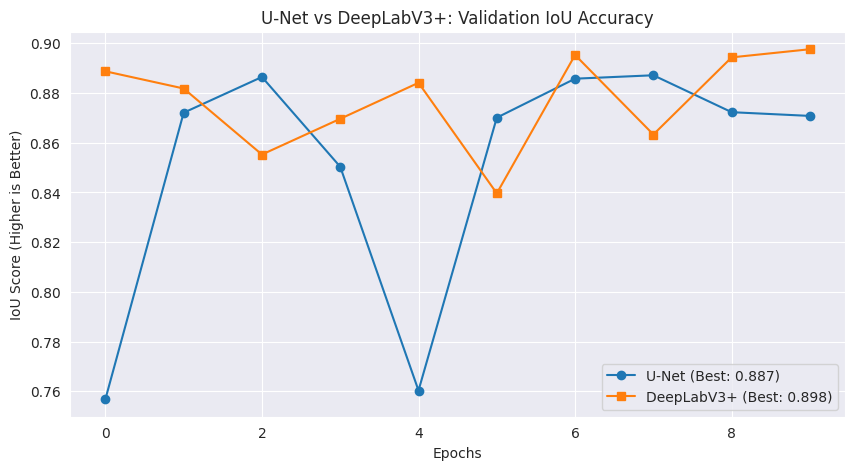

🏆 WINNER: DeepLabV3+ is better by 0.0105 IoU points.


In [ ]:
# Compare Training Progress
plt.figure(figsize=(10, 5))
plt.plot(unet_history['val_iou'], label=f'U-Net (Best: {unet_best_iou:.3f})', marker='o')
plt.plot(deeplab_history['val_iou'], label=f'DeepLabV3+ (Best: {deeplab_best_iou:.3f})', marker='s')
plt.title("U-Net vs DeepLabV3+: Validation IoU Accuracy")
plt.xlabel("Epochs")
plt.ylabel("IoU Score (Higher is Better)")
plt.legend()
plt.grid(True)
plt.show()

# Final Verdict
if unet_best_iou > deeplab_best_iou:
    print(f"🏆 WINNER: U-Net is better by {(unet_best_iou - deeplab_best_iou):.4f} IoU points.")
else:
    print(f"🏆 WINNER: DeepLabV3+ is better by {(deeplab_best_iou - unet_best_iou):.4f} IoU points.")

In [8]:
# ============================================================
# GPU ENFORCEMENT
# ============================================================
assert torch.cuda.is_available(), "CUDA GPU is required but not detected."

DEVICE = torch.device("cuda")
torch.backends.cudnn.benchmark = True  # Optimized for fixed image sizes

print(f"Using GPU: {torch.cuda.get_device_name(0)}")
print("GPU enforcement successful.")

Using GPU: NVIDIA GeForce RTX 3050 Laptop GPU
GPU enforcement successful.


In [9]:
# ============================================================
# SEGMENTATION METRICS
# ============================================================

def pixel_accuracy(pred, target):
    """
    Computes overall pixel-wise classification accuracy.
    """
    correct = (pred == target).sum().item()
    total = target.numel()
    return correct / total


def compute_miou_dice(pred, target, num_classes):
    """
    Computes Mean IoU and Mean Dice Score across all classes.
    """
    ious, dices = [], []

    for cls in range(num_classes):
        pred_c = (pred == cls)
        target_c = (target == cls)

        intersection = (pred_c & target_c).sum().item()
        union = (pred_c | target_c).sum().item()

        # IoU
        ious.append(1.0 if union == 0 else intersection / union)

        # Dice
        total = pred_c.sum().item() + target_c.sum().item()
        dices.append(1.0 if total == 0 else 2 * intersection / total)

    return np.mean(ious), np.mean(dices)

# ============================================================
# TRAINING & VALIDATION ENGINE
# ============================================================

def train_one_epoch(model, loader, optimizer, loss_fn, scaler):
    """
    Runs one training epoch using mixed precision on GPU.
    """
    model.train()
    epoch_loss = 0.0

    for images, masks in tqdm(loader, desc="Train", leave=False):
        images = images.to(DEVICE, non_blocking=True)
        masks = masks.to(DEVICE, non_blocking=True)

        optimizer.zero_grad()

        with autocast():  # GPU mixed precision
            outputs = model(images)
            loss = loss_fn(outputs, masks)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        epoch_loss += loss.item()

    return epoch_loss / len(loader)


def validate(model, loader, loss_fn, num_classes):
    """
    Evaluates model on validation set.
    """
    model.eval()
    losses, accs, ious, dices = [], [], [], []

    with torch.no_grad():
        for images, masks in tqdm(loader, desc="Val", leave=False):
            images = images.to(DEVICE, non_blocking=True)
            masks = masks.to(DEVICE, non_blocking=True)

            outputs = model(images)
            loss = loss_fn(outputs, masks)
            preds = torch.argmax(outputs, dim=1)

            accs.append(pixel_accuracy(preds, masks))
            miou, dice = compute_miou_dice(preds, masks, num_classes)

            losses.append(loss.item())
            ious.append(miou)
            dices.append(dice)

    return {
        "loss": np.mean(losses),
        "accuracy": np.mean(accs),
        "miou": np.mean(ious),
        "dice": np.mean(dices)
    }

In [ ]:
# ============================================================
# COMMON TRAINING SETTINGS
# ============================================================

LR = 5e-4
EPOCHS = 20
loss_fn = nn.CrossEntropyLoss()
scaler = GradScaler()

In [12]:
print("\n==================== U-Net ====================")

unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=n_classes
).to(DEVICE)

optimizer = torch.optim.AdamW(unet.parameters(), lr=LR)
best_unet_miou = 0.0

for epoch in range(EPOCHS):
    train_loss = train_one_epoch(unet, train_loader, optimizer, loss_fn, scaler)
    metrics = validate(unet, valid_loader, loss_fn, n_classes)

    print(
        f"[U-Net] Epoch {epoch+1}/{EPOCHS} | "
        f"Loss {train_loss:.4f} | "
        f"Acc {metrics['accuracy']:.4f} | "
        f"mIoU {metrics['miou']:.4f} | "
        f"Dice {metrics['dice']:.4f}"
    )

    if metrics["miou"] > best_unet_miou:
        best_unet_miou = metrics["miou"]
        torch.save(unet.state_dict(), "best_unet.pth")



==================== U-Net ====================


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 1/50 | Loss 0.3104 | Acc 0.9276 | mIoU 0.8515 | Dice 0.9171


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 2/50 | Loss 0.2461 | Acc 0.9395 | mIoU 0.8733 | Dice 0.9311


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 3/50 | Loss 0.2149 | Acc 0.9446 | mIoU 0.8827 | Dice 0.9365


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 4/50 | Loss 0.1960 | Acc 0.9540 | mIoU 0.8993 | Dice 0.9458


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 5/50 | Loss 0.1908 | Acc 0.9493 | mIoU 0.8916 | Dice 0.9416


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 6/50 | Loss 0.1899 | Acc 0.9519 | mIoU 0.8953 | Dice 0.9434


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 7/50 | Loss 0.1584 | Acc 0.9530 | mIoU 0.8977 | Dice 0.9448


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 8/50 | Loss 0.1410 | Acc 0.9410 | mIoU 0.8800 | Dice 0.9338


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 9/50 | Loss 0.1675 | Acc 0.9523 | mIoU 0.8964 | Dice 0.9442


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 10/50 | Loss 0.1249 | Acc 0.9532 | mIoU 0.8980 | Dice 0.9450


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 11/50 | Loss 0.1087 | Acc 0.9537 | mIoU 0.9000 | Dice 0.9463


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 12/50 | Loss 0.1404 | Acc 0.9273 | mIoU 0.8525 | Dice 0.9187


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 13/50 | Loss 0.1342 | Acc 0.9567 | mIoU 0.9058 | Dice 0.9496


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 14/50 | Loss 0.1046 | Acc 0.9398 | mIoU 0.8735 | Dice 0.9307


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 15/50 | Loss 0.1145 | Acc 0.9539 | mIoU 0.9009 | Dice 0.9467


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 16/50 | Loss 0.0966 | Acc 0.9555 | mIoU 0.9036 | Dice 0.9482


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 17/50 | Loss 0.0971 | Acc 0.9562 | mIoU 0.9054 | Dice 0.9493


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 18/50 | Loss 0.1006 | Acc 0.6114 | mIoU 0.3619 | Dice 0.4847


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 19/50 | Loss 0.1051 | Acc 0.9539 | mIoU 0.9010 | Dice 0.9468


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 20/50 | Loss 0.0662 | Acc 0.9547 | mIoU 0.9027 | Dice 0.9478


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 21/50 | Loss 0.0610 | Acc 0.9576 | mIoU 0.9081 | Dice 0.9509


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 22/50 | Loss 0.0573 | Acc 0.9530 | mIoU 0.8987 | Dice 0.9453


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 23/50 | Loss 0.0543 | Acc 0.9554 | mIoU 0.9035 | Dice 0.9481


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 24/50 | Loss 0.0469 | Acc 0.9555 | mIoU 0.9040 | Dice 0.9483


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 25/50 | Loss 0.0654 | Acc 0.9559 | mIoU 0.9047 | Dice 0.9487


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 26/50 | Loss 0.0420 | Acc 0.9545 | mIoU 0.9019 | Dice 0.9471


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 27/50 | Loss 0.0421 | Acc 0.9526 | mIoU 0.8983 | Dice 0.9451


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 28/50 | Loss 0.0510 | Acc 0.8069 | mIoU 0.6556 | Dice 0.7775


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 29/50 | Loss 0.1852 | Acc 0.9395 | mIoU 0.8745 | Dice 0.9314


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 30/50 | Loss 0.0781 | Acc 0.9471 | mIoU 0.8882 | Dice 0.9390


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 31/50 | Loss 0.0751 | Acc 0.9422 | mIoU 0.8770 | Dice 0.9330


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 32/50 | Loss 0.0559 | Acc 0.9525 | mIoU 0.8984 | Dice 0.9451


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 33/50 | Loss 0.0801 | Acc 0.9487 | mIoU 0.8897 | Dice 0.9399


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 34/50 | Loss 0.0955 | Acc 0.9525 | mIoU 0.8981 | Dice 0.9453


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 35/50 | Loss 0.0508 | Acc 0.9541 | mIoU 0.9008 | Dice 0.9466


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 36/50 | Loss 0.0433 | Acc 0.9574 | mIoU 0.9076 | Dice 0.9506


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 37/50 | Loss 0.0395 | Acc 0.9558 | mIoU 0.9040 | Dice 0.9484


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 38/50 | Loss 0.0361 | Acc 0.9557 | mIoU 0.9039 | Dice 0.9485


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 39/50 | Loss 0.0352 | Acc 0.9545 | mIoU 0.9019 | Dice 0.9473


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 40/50 | Loss 0.0334 | Acc 0.9566 | mIoU 0.9057 | Dice 0.9494


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 41/50 | Loss 0.0315 | Acc 0.9540 | mIoU 0.9008 | Dice 0.9466


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 42/50 | Loss 0.0343 | Acc 0.7193 | mIoU 0.5294 | Dice 0.6794


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 43/50 | Loss 0.0443 | Acc 0.9558 | mIoU 0.9034 | Dice 0.9479


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 44/50 | Loss 0.0362 | Acc 0.9520 | mIoU 0.8972 | Dice 0.9444


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 45/50 | Loss 0.0315 | Acc 0.9550 | mIoU 0.9027 | Dice 0.9478


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 46/50 | Loss 0.0307 | Acc 0.9570 | mIoU 0.9065 | Dice 0.9499


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 47/50 | Loss 0.0285 | Acc 0.9560 | mIoU 0.9047 | Dice 0.9488


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 48/50 | Loss 0.0265 | Acc 0.9545 | mIoU 0.9017 | Dice 0.9470


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 49/50 | Loss 0.0259 | Acc 0.9556 | mIoU 0.9039 | Dice 0.9483


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[U-Net] Epoch 50/50 | Loss 0.0248 | Acc 0.9541 | mIoU 0.9011 | Dice 0.9466


In [13]:
print("\n==================== DeepLabV3+ ====================")

deeplab = smp.DeepLabV3Plus(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=n_classes
).to(DEVICE)

optimizer = torch.optim.AdamW(deeplab.parameters(), lr=LR)
best_deeplab_miou = 0.0

for epoch in range(EPOCHS):
    train_loss = train_one_epoch(deeplab, train_loader, optimizer, loss_fn, scaler)
    metrics = validate(deeplab, valid_loader, loss_fn, n_classes)

    print(
        f"[DeepLab] Epoch {epoch+1}/{EPOCHS} | "
        f"Loss {train_loss:.4f} | "
        f"Acc {metrics['accuracy']:.4f} | "
        f"mIoU {metrics['miou']:.4f} | "
        f"Dice {metrics['dice']:.4f}"
    )

    if metrics["miou"] > best_deeplab_miou:
        best_deeplab_miou = metrics["miou"]
        torch.save(deeplab.state_dict(), "best_deeplab.pth")



==================== DeepLabV3+ ====================


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 1/50 | Loss 0.3080 | Acc 0.9291 | mIoU 0.8534 | Dice 0.9188


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 2/50 | Loss 0.2502 | Acc 0.9304 | mIoU 0.8585 | Dice 0.9214


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 3/50 | Loss 0.2212 | Acc 0.9369 | mIoU 0.8664 | Dice 0.9266


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 4/50 | Loss 0.2120 | Acc 0.9417 | mIoU 0.8770 | Dice 0.9329


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 5/50 | Loss 0.2236 | Acc 0.9408 | mIoU 0.8739 | Dice 0.9304


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 6/50 | Loss 0.1963 | Acc 0.9512 | mIoU 0.8942 | Dice 0.9427


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 7/50 | Loss 0.1819 | Acc 0.9298 | mIoU 0.8601 | Dice 0.9209


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 8/50 | Loss 0.1810 | Acc 0.9425 | mIoU 0.8780 | Dice 0.9335


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 9/50 | Loss 0.1579 | Acc 0.8681 | mIoU 0.7529 | Dice 0.8549


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 10/50 | Loss 0.2012 | Acc 0.9491 | mIoU 0.8906 | Dice 0.9405


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 11/50 | Loss 0.1574 | Acc 0.9525 | mIoU 0.8975 | Dice 0.9449


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 12/50 | Loss 0.2147 | Acc 0.9388 | mIoU 0.8730 | Dice 0.9307


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 13/50 | Loss 0.1678 | Acc 0.9482 | mIoU 0.8882 | Dice 0.9394


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 14/50 | Loss 0.1521 | Acc 0.9490 | mIoU 0.8902 | Dice 0.9403


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 15/50 | Loss 0.1290 | Acc 0.9542 | mIoU 0.9000 | Dice 0.9461


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 16/50 | Loss 0.1292 | Acc 0.9560 | mIoU 0.9040 | Dice 0.9485


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 17/50 | Loss 0.1371 | Acc 0.8971 | mIoU 0.7988 | Dice 0.8844


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 18/50 | Loss 0.1441 | Acc 0.9409 | mIoU 0.8766 | Dice 0.9325


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 19/50 | Loss 0.1540 | Acc 0.9539 | mIoU 0.8991 | Dice 0.9454


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 20/50 | Loss 0.1477 | Acc 0.9554 | mIoU 0.9021 | Dice 0.9473


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 21/50 | Loss 0.1079 | Acc 0.9554 | mIoU 0.9023 | Dice 0.9473


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 22/50 | Loss 0.0990 | Acc 0.9505 | mIoU 0.8925 | Dice 0.9414


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 23/50 | Loss 0.0897 | Acc 0.9458 | mIoU 0.8837 | Dice 0.9357


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 24/50 | Loss 0.1071 | Acc 0.8772 | mIoU 0.7825 | Dice 0.8618


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 25/50 | Loss 0.1572 | Acc 0.9545 | mIoU 0.9006 | Dice 0.9464


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 26/50 | Loss 0.0945 | Acc 0.9538 | mIoU 0.8984 | Dice 0.9449


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 27/50 | Loss 0.1143 | Acc 0.9526 | mIoU 0.8975 | Dice 0.9448


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 28/50 | Loss 0.0938 | Acc 0.9564 | mIoU 0.9047 | Dice 0.9487


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 29/50 | Loss 0.1712 | Acc 0.9152 | mIoU 0.8275 | Dice 0.9029


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 30/50 | Loss 0.1407 | Acc 0.9430 | mIoU 0.8785 | Dice 0.9336


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 31/50 | Loss 0.0906 | Acc 0.9521 | mIoU 0.8959 | Dice 0.9434


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 32/50 | Loss 0.0745 | Acc 0.9506 | mIoU 0.8933 | Dice 0.9420


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 33/50 | Loss 0.0723 | Acc 0.9517 | mIoU 0.8958 | Dice 0.9435


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 34/50 | Loss 0.0650 | Acc 0.9509 | mIoU 0.8941 | Dice 0.9424


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 35/50 | Loss 0.0626 | Acc 0.9554 | mIoU 0.9025 | Dice 0.9473


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 36/50 | Loss 0.0640 | Acc 0.9491 | mIoU 0.8908 | Dice 0.9410


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 37/50 | Loss 0.0598 | Acc 0.9525 | mIoU 0.8969 | Dice 0.9441


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 38/50 | Loss 0.0611 | Acc 0.9491 | mIoU 0.8910 | Dice 0.9410


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 39/50 | Loss 0.0838 | Acc 0.9522 | mIoU 0.8951 | Dice 0.9430


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 40/50 | Loss 0.0636 | Acc 0.9559 | mIoU 0.9029 | Dice 0.9474


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 41/50 | Loss 0.0520 | Acc 0.9557 | mIoU 0.9030 | Dice 0.9478


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 42/50 | Loss 0.0503 | Acc 0.9572 | mIoU 0.9067 | Dice 0.9500


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 43/50 | Loss 0.0480 | Acc 0.9458 | mIoU 0.8832 | Dice 0.9364


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 44/50 | Loss 0.0753 | Acc 0.9498 | mIoU 0.8906 | Dice 0.9402


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 45/50 | Loss 0.0508 | Acc 0.9558 | mIoU 0.9030 | Dice 0.9476


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 46/50 | Loss 0.0426 | Acc 0.9547 | mIoU 0.9016 | Dice 0.9470


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 47/50 | Loss 0.0400 | Acc 0.9531 | mIoU 0.8973 | Dice 0.9443


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 48/50 | Loss 0.0369 | Acc 0.9546 | mIoU 0.9014 | Dice 0.9468


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 49/50 | Loss 0.0353 | Acc 0.9542 | mIoU 0.8999 | Dice 0.9459


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[DeepLab] Epoch 50/50 | Loss 0.0337 | Acc 0.9516 | mIoU 0.8960 | Dice 0.9438


In [14]:
print("\n==================== SegFormer ====================")

segformer = smp.Segformer(
    encoder_name="mit_b2",
    encoder_weights="imagenet",
    in_channels=3,
    classes=n_classes
).to(DEVICE)

optimizer = torch.optim.AdamW(segformer.parameters(), lr=LR)
best_segformer_miou = 0.0

for epoch in range(EPOCHS):
    train_loss = train_one_epoch(segformer, train_loader, optimizer, loss_fn, scaler)
    metrics = validate(segformer, valid_loader, loss_fn, n_classes)

    print(
        f"[SegFormer] Epoch {epoch+1}/{EPOCHS} | "
        f"Loss {train_loss:.4f} | "
        f"Acc {metrics['accuracy']:.4f} | "
        f"mIoU {metrics['miou']:.4f} | "
        f"Dice {metrics['dice']:.4f}"
    )

    if metrics["miou"] > best_segformer_miou:
        best_segformer_miou = metrics["miou"]
        torch.save(segformer.state_dict(), "best_segformer.pth")
print("\n==================== SegFormer Training Complete ====================")


==================== SegFormer ====================


config.json:   0%|          | 0.00/135 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/98.9M [00:00<?, ?B/s]

Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[SegFormer] Epoch 1/50 | Loss 0.3574 | Acc 0.8511 | mIoU 0.7102 | Dice 0.8169


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[SegFormer] Epoch 2/50 | Loss 0.2567 | Acc 0.8589 | mIoU 0.7207 | Dice 0.8202


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[SegFormer] Epoch 3/50 | Loss 0.2078 | Acc 0.8894 | mIoU 0.7889 | Dice 0.8774


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[SegFormer] Epoch 4/50 | Loss 0.1743 | Acc 0.9372 | mIoU 0.8682 | Dice 0.9267


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[SegFormer] Epoch 5/50 | Loss 0.1856 | Acc 0.8811 | mIoU 0.7821 | Dice 0.8696


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[SegFormer] Epoch 6/50 | Loss 0.1627 | Acc 0.9445 | mIoU 0.8818 | Dice 0.9354


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[SegFormer] Epoch 7/50 | Loss 0.1578 | Acc 0.9521 | mIoU 0.8965 | Dice 0.9442


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[SegFormer] Epoch 8/50 | Loss 0.1544 | Acc 0.9268 | mIoU 0.8538 | Dice 0.9182


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[SegFormer] Epoch 9/50 | Loss 0.1199 | Acc 0.9478 | mIoU 0.8883 | Dice 0.9391


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[SegFormer] Epoch 10/50 | Loss 0.1238 | Acc 0.8718 | mIoU 0.7718 | Dice 0.8605


Train:   0%|          | 0/118 [00:00<?, ?it/s]

Val:   0%|          | 0/10 [00:00<?, ?it/s]

[SegFormer] Epoch 11/50 | Loss 0.1603 | Acc 0.9204 | mIoU 0.8467 | Dice 0.9118


Train:   0%|          | 0/118 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
print("\n==================== HRNet-OCR ====================")

hrnet = smp.HRNet(
    encoder_name="hrnet_w32",
    encoder_weights="imagenet",
    in_channels=3,
    classes=n_classes
).to(DEVICE)

optimizer = torch.optim.AdamW(hrnet.parameters(), lr=LR)
best_hrnet_miou = 0.0

for epoch in range(EPOCHS):
    train_loss = train_one_epoch(hrnet, train_loader, optimizer, loss_fn, scaler)
    metrics = validate(hrnet, valid_loader, loss_fn, n_classes)

    print(
        f"[HRNet] Epoch {epoch+1}/{EPOCHS} | "
        f"Loss {train_loss:.4f} | "
        f"Acc {metrics['accuracy']:.4f} | "
        f"mIoU {metrics['miou']:.4f} | "
        f"Dice {metrics['dice']:.4f}"
    )

    if metrics["miou"] > best_hrnet_miou:
        best_hrnet_miou = metrics["miou"]
        torch.save(hrnet.state_dict(), "best_hrnet.pth")

print("\n==================== HRNet-OCR Training Complete ====================")

In [14]:
print("\n==================== YOLOv8-Seg ====================")

yolo8 = YOLO("yolov8l-seg.pt")

yolo8.train(
    data=yaml_path,
    epochs=EPOCHS,
    imgsz=640,
    batch=16,
    device=0,
    project="segmentation_results",
    name="yolov8"
)

yolo8.val(data=yaml_path, device=0)
print("\n==================== YOLOv8 Training Complete ====================")


==================== YOLOv8-Seg ====================
New https://pypi.org/project/ultralytics/8.3.248 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.163  Python-3.12.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Users\debas\Videos\Infosys Springboard Internship Project\vegetation-segmentation-4\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mix

train: Scanning C:\Users\debas\Videos\Infosys Springboard Internship Project\vegetation-segmentation-4\train\labels.cache... 945 images, 117 backgrounds, 0 corrupt: 100%|██████████| 945/945 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.30.2 ms, read: 227.788.4 MB/s, size: 165.6 KB)


val: Scanning C:\Users\debas\Videos\Infosys Springboard Internship Project\vegetation-segmentation-4\valid\labels.cache... 83 images, 10 backgrounds, 0 corrupt: 100%|██████████| 83/83 [00:00<?, ?it/s]


Plotting labels to segmentation_results\yolov82\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 106 weight(decay=0.0), 117 weight(decay=0.0005), 116 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to segmentation_results\yolov82
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/60 [00:07<?, ?it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 200.00 MiB. GPU 0 has a total capacity of 4.00 GiB of which 0 bytes is free. Of the allocated memory 7.99 GiB is allocated by PyTorch, and 110.30 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
print("\n==================== YOLO11-Seg ====================")

yolo11 = YOLO("yolo11l-seg.pt")

yolo11.train(
    data=yaml_path,
    epochs=EPOCHS,
    imgsz=640,
    batch=16,
    device=0,
    project="segmentation_results",
    name="yolo11"
)

yolo11.val(data=yaml_path, device=0)
print("\n==================== YOLO11 Training Complete ====================")

In [ ]:
print("\n=========== FINAL mIoU COMPARISON ===========")
print(f"U-Net       : {best_unet_miou:.4f}")
print(f"DeepLabV3+  : {best_deeplab_miou:.4f}")
print(f"SegFormer   : {best_segformer_miou:.4f}")
print(f"HRNet-OCR   : {best_hrnet_miou:.4f}")
print("YOLOv8 / YOLO11 results available in Ultralytics logs.")

## YOLO11-Seg

In [ ]:
# Load a pretrained segmentation model
model = YOLO(f"yolo11{Config.MODEL_SIZE}.pt")

print(f"Initializing {Config.TASK} training on {DEVICE}...")

# Train
results = model.train(
    data=yaml_path,
    epochs=Config.EPOCHS,
    imgsz=Config.IMG_SIZE,
    batch=Config.BATCH_SIZE,
    device=DEVICE,
    optimizer=Config.OPTIMIZER,
    seed=Config.SEED,
    box=7.5,      # Box loss gain
    cls=0.5,      # Class loss gain
    dfl=1.5,      # Distribution Focal Loss gain
    # Segmentation specific arg (mask ratio) is handled automatically by -seg weights
    plots=True,
    save=True,
    val=True,
    verbose=True
)

print(f"Training finished. Best model saved at: {results.save_dir}")

Initializing segment training on 0...
Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/vegetation-segmentation-4/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11l-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask

# 6. Evaluation Metrics

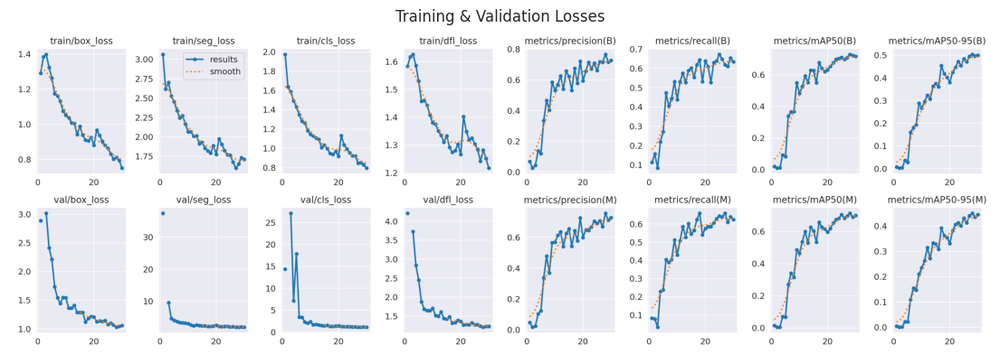

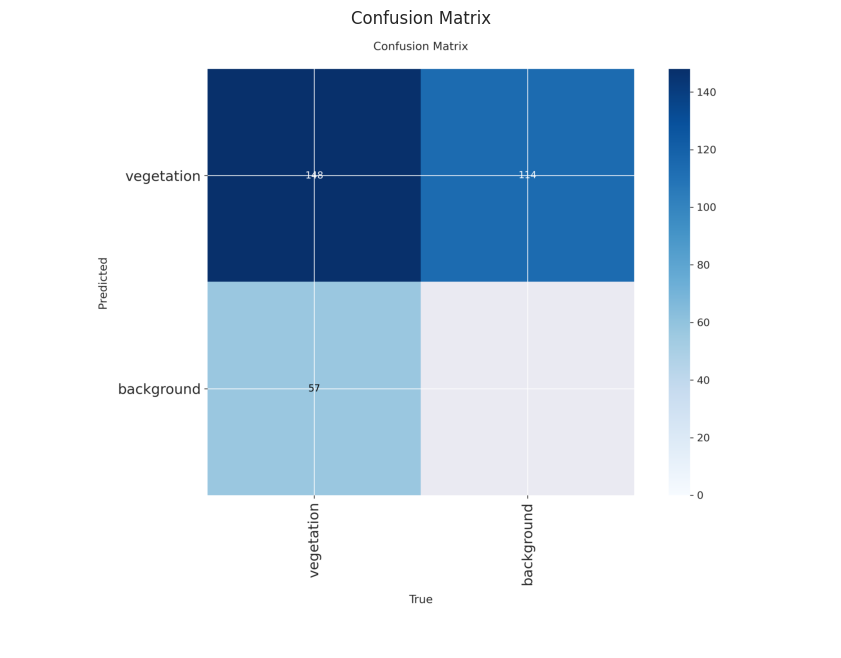

Accessing detailed metrics...
Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11l-seg summary (fused): 203 layers, 27,585,363 parameters, 0 gradients, 131.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2117.9±966.1 MB/s, size: 127.7 KB)
val: Scanning /content/vegetation-segmentation-4/test/labels.cache... 40 images, 5 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 40/40 79.3Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.4s/it 4.3s
                   all         40         99      0.558      0.779       0.66      0.432      0.552      0.758      0.659       0.38
Speed: 9.2ms preprocess, 47.7ms inference, 0.0ms loss, 4.9ms postprocess per image
Results saved to /content/runs/segment/val2

 SEGMENTATION METRICS (Test Set)
Mask mAP@50:    0.6588
Mask mAP@50-95: 0.3802
----------------------------------------
 BOX METRICS (Te

In [ ]:
results_dir = Path(results.save_dir)

# Helper to show images
def show_results_plot(file_name, title):
    p = results_dir / file_name
    if p.exists():
        img = Image.open(p)
        plt.figure(figsize=(14, 8))
        plt.imshow(img)
        plt.axis('off')
        plt.title(title)
        plt.show()
    else:
        print(f"File {file_name} not generated yet.")

# Plot Loss Curves
show_results_plot("results.png", "Training & Validation Losses")

# Plot Confusion Matrix
show_results_plot("confusion_matrix.png", "Confusion Matrix")

# Print precise metrics
# Note: YOLOv8 logs both Box (detection) and Mask (segmentation) metrics
print("Accessing detailed metrics...")
try:
    # Reload best model for validation
    best_model = YOLO(results_dir / "weights" / "best.pt")
    metrics = best_model.val(split='test')

    print("\n" + "="*40)
    print(" SEGMENTATION METRICS (Test Set)")
    print("="*40)
    print(f"Mask mAP@50:    {metrics.seg.map50:.4f}")
    print(f"Mask mAP@50-95: {metrics.seg.map:.4f}")
    print("-" * 40)
    print(" BOX METRICS (Test Set)")
    print("-" * 40)
    print(f"Box  mAP@50:    {metrics.box.map50:.4f}")
    print(f"Box  mAP@50-95: {metrics.box.map:.4f}")
    print("="*40)
except Exception as e:
    print(f"Could not run automated metric printing: {e}")

# 7. Inference on Test Data

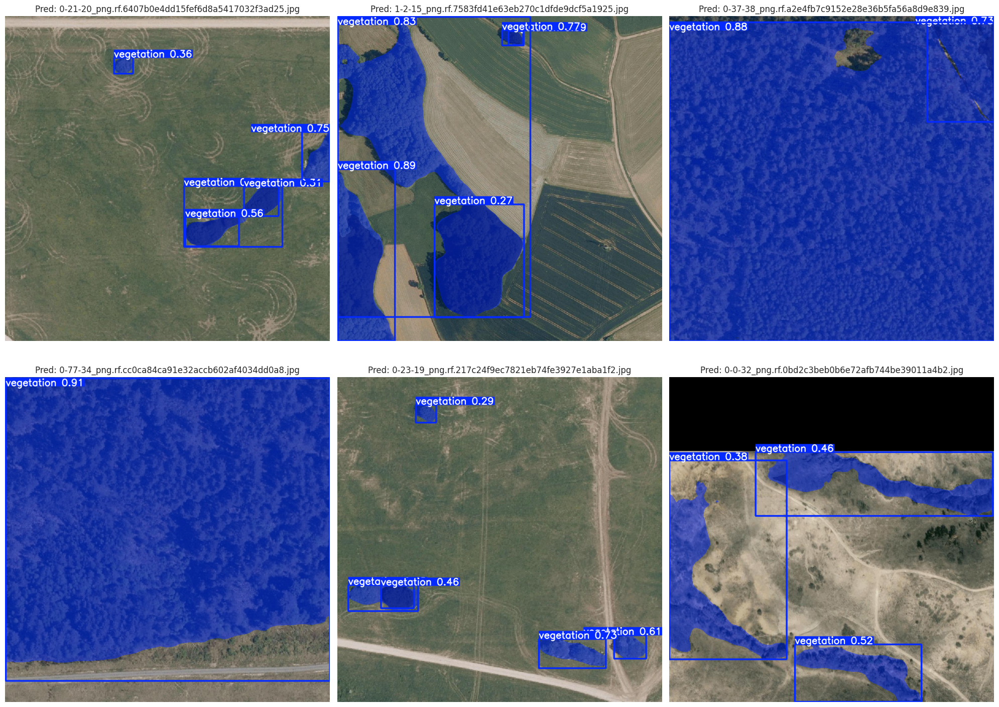

In [ ]:
test_images_dir = os.path.join(Config.DATASET_DIR, "test", "images")
if not os.path.exists(test_images_dir):
    # Fallback to valid if test doesn't exist
    test_images_dir = os.path.join(Config.DATASET_DIR, "valid", "images")

test_files = [f for f in os.listdir(test_images_dir) if f.endswith(('.jpg', '.png'))]
sample_test_files = random.sample(test_files, min(len(test_files), 6))

# Load best model
best_model_path = results_dir / "weights" / "best.pt"
best_model = YOLO(best_model_path)

plt.figure(figsize=(20, 15))
for i, file_name in enumerate(sample_test_files):
    img_path = os.path.join(test_images_dir, file_name)

    # Predict
    # retina_masks=True gives higher quality masks
    results = best_model.predict(source=img_path, conf=0.25, retina_masks=True, verbose=False)

    # Plot using Ultralytics' built-in plotter which handles masks beautifully
    res_plotted = results[0].plot()
    res_rgb = cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, i + 1)
    plt.imshow(res_rgb)
    plt.axis('off')
    plt.title(f"Pred: {file_name}")

plt.tight_layout()
plt.show()

# 8. Model Export

In [ ]:
print("Exporting model...")

# Export to ONNX
try:
    path_onnx = best_model.export(format="onnx")
    print(f"ONNX model saved at: {path_onnx}")
except Exception as e:
    print(f"ONNX export failed: {e}")

# Download trigger for Google Colab
if 'google.colab' in sys.modules:
    from google.colab import files
    if os.path.exists(path_onnx):
        files.download(path_onnx)

Exporting model...
Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.00GHz)

PyTorch: starting from '/content/runs/segment/train3/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 37, 8400), (1, 32, 160, 160)) (53.2 MB)

ONNX: starting export with onnx 1.19.1 opset 22...
ONNX: slimming with onnxslim 0.1.77...
ONNX: export success ✅ 11.4s, saved as '/content/runs/segment/train3/weights/best.onnx' (105.6 MB)

Export complete (15.1s)
Results saved to /content/runs/segment/train3/weights
Predict:         yolo predict task=segment model=/content/runs/segment/train3/weights/best.onnx imgsz=640  
Validate:        yolo val task=segment model=/content/runs/segment/train3/weights/best.onnx imgsz=640 data=/content/vegetation-segmentation-4/data.yaml  
Visualize:       https://netron.app
ONNX model saved at: /content/runs/segment/train3/weights/best.onnx


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#  **SAM 2 Model Implementation**

# 9. Install & Setup SAM 2

In [ ]:

!pip install ultralytics -U -q

import torch
from ultralytics import SAM, YOLO
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Check GPU
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using Device: {device}")

Using Device: cuda


# 10. YOLO Detection + SAM 2 Refinement

YOLO detected 1 objects. handing over to SAM 2...


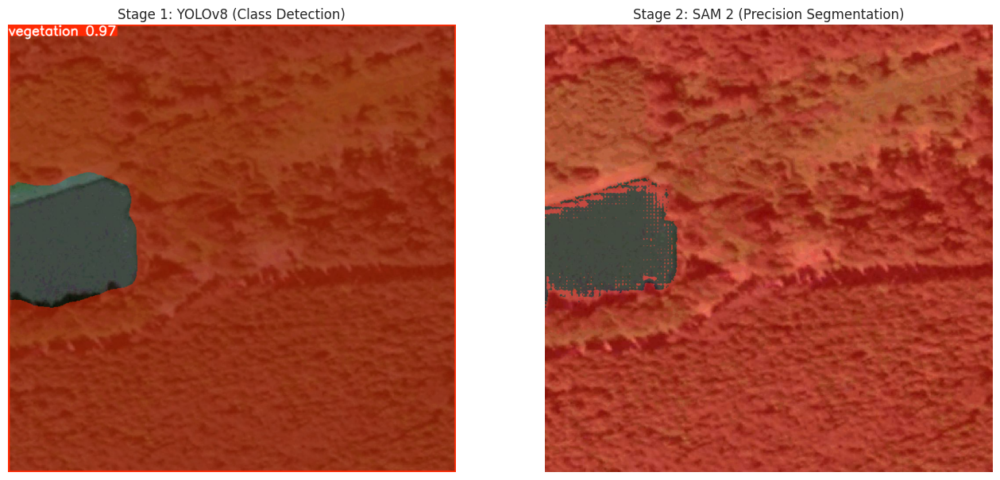

In [ ]:
# 1. Load TRAINED YOLO model
yolo_model = YOLO("runs/segment/train/weights/best.pt")

# 2. Load the SAM 2 Model
# Options: sam2.1_t.pt (tiny), sam2.1_s.pt (small), sam2.1_b.pt (base), sam2.1_l.pt (large)
sam_model = SAM("sam2.1_s.pt")

def hybrid_inference(image_path):
    """
    1. Detects objects using YOLO (for Class ID).
    2. Refines masks using SAM 2 (for Precision).
    """
    # A. Run YOLO Inference
    yolo_results = yolo_model(image_path, verbose=False)[0]

    # Extract Bounding Boxes from YOLO
    boxes = yolo_results.boxes.xyxy.cpu().numpy()
    class_ids = yolo_results.boxes.cls.cpu().numpy().astype(int)
    class_names = yolo_results.names

    if len(boxes) == 0:
        print("No vegetation detected by YOLO.")
        return

    print(f"YOLO detected {len(boxes)} objects. handing over to SAM 2...")

    # B. Run SAM 2 Inference using YOLO boxes as prompts
    # This tells SAM: "Segment the object inside this box"
    sam_results = sam_model(image_path, bboxes=boxes, verbose=False)[0]

    # C. Visualization
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(16, 8))

    # Plot 1: Original YOLO Prediction
    plt.subplot(1, 2, 1)
    plt.imshow(yolo_results.plot())
    plt.title("Stage 1: YOLOv8 (Class Detection)")
    plt.axis('off')

    # Plot 2: SAM 2 Refined Prediction
    # We manually draw masks because SAM results are raw masks
    sam_plot = img.copy()

    # Overlay SAM masks
    # Note: SAM returns masks in the same order as the input boxes
    if sam_results.masks is not None:
        masks = sam_results.masks.data.cpu().numpy() # (N, H, W)

        for i, mask_raw in enumerate(masks):
            # Convert mask to a suitable numerical type (uint8) for OpenCV
            if mask_raw.dtype == bool:
                mask = mask_raw.astype(np.uint8) * 255 # Convert boolean to 0/255 uint8
            elif mask_raw.dtype in [np.float32, np.float64]:
                mask = (mask_raw * 255).astype(np.uint8) # Convert float 0-1 to 0-255 uint8
            else:
                mask = mask_raw # Already a compatible type

            # Resize mask to image size if necessary (SAM sometimes returns low-res)
            mask = cv2.resize(mask, (img.shape[1], img.shape[0]))

            # Color based on Class ID from YOLO
            # Simple color cycle: Red, Green, Blue
            color_map = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]
            color = color_map[class_ids[i] % 3]

            # Create colored overlay
            colored_mask = np.zeros_like(img, dtype=np.uint8)
            colored_mask[mask > 0] = color # Use > 0 for 0/255 uint8 masks

            # Blend
            sam_plot = cv2.addWeighted(sam_plot, 1.0, colored_mask, 0.5, 0)

            # Add Label
            x1, y1, x2, y2 = map(int, boxes[i])
            label = class_names[class_ids[i]]
            cv2.putText(sam_plot, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

    plt.subplot(1, 2, 2)
    plt.imshow(sam_plot)
    plt.title("Stage 2: SAM 2 (Precision Segmentation)")
    plt.axis('off')

    plt.show()

# Run on a sample image from test set
import os
import random
test_dir = os.path.join("vegetation-segmentation-4", "test", "images")
if os.path.exists(test_dir):
    random_file = random.choice(os.listdir(test_dir))
    hybrid_inference(os.path.join(test_dir, random_file))

# 11. Auto-Annotate Dataset with SAM 2

In [ ]:
from ultralytics.data.annotator import auto_annotate

# This will generate a NEW dataset with perfect SAM 2 polygon masks
# Usage: Use this to re-train YOLO on better data
def run_auto_annotation():
    print("Starting Auto-Annotation...")
    auto_annotate(
        data=os.path.join("vegetation-segmentation-4", "valid", "images"), # Target folder
        det_model="runs/segment/train/weights/best.pt", # Your trained YOLO
        sam_model="sam2.1_b.pt",                          # SAM 2 Base model
        output_dir="auto_labeled_dataset"                 # Output folder
    )
    print("Annotation complete. Check 'auto_labeled_dataset' folder.")

run_auto_annotation()

Starting Auto-Annotation...

image 1/83 /content/vegetation-segmentation-4/valid/images/0-0-20_png.rf.fc47a980f69ef8a4fca62f2ba0020b5c.jpg: 640x640 2 vegetations, 9.3ms
image 2/83 /content/vegetation-segmentation-4/valid/images/0-1-23_png.rf.33ea6454a56d94eb4169b56b03eb166a.jpg: 640x640 (no detections), 7.9ms
image 3/83 /content/vegetation-segmentation-4/valid/images/0-10-9_png.rf.9d52e3f2e793ce21ce737e4c69f66a70.jpg: 640x640 4 vegetations, 6.6ms
image 4/83 /content/vegetation-segmentation-4/valid/images/0-11-46_png.rf.1252e9afbcafddbf1ffd8d6ff6c7dff5.jpg: 640x640 1 vegetation, 6.9ms
image 5/83 /content/vegetation-segmentation-4/valid/images/0-12-2_png.rf.88338502f55abbbdb215779d568397d4.jpg: 640x640 1 vegetation, 7.0ms
image 6/83 /content/vegetation-segmentation-4/valid/images/0-14-44_png.rf.52f4eefd419b51e697ea101f422abf17.jpg: 640x640 1 vegetation, 6.8ms
image 7/83 /content/vegetation-segmentation-4/valid/images/0-14-7_png.rf.b3ec9ff5ed49936c9a6ec843685be78d.jpg: 640x640 4 vegetatio

Visualizing auto-annotated samples...


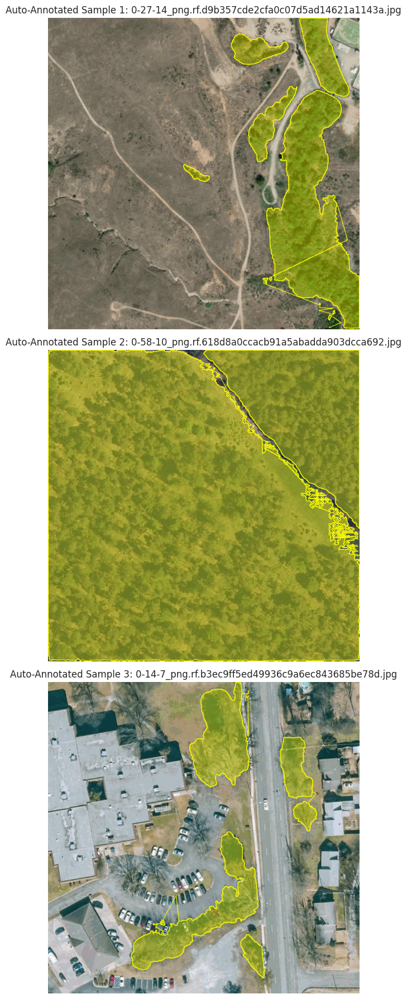

In [ ]:
import glob

def visualize_auto_annotated_samples(image_dir, label_dir, class_names, num_samples=3):
    image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
    if not image_files:
        print("No images found to visualize in the auto-annotated dataset.")
        return

    samples = random.sample(image_files, min(len(image_files), num_samples))

    plt.figure(figsize=(20, 6 * num_samples))

    for i, img_file in enumerate(samples):
        # Load Image
        img_path = os.path.join(image_dir, img_file)
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h, w, _ = image.shape

        # Create a mask overlay
        overlay = image.copy()

        # Load Label
        label_file = img_file.rsplit('.', 1)[0] + ".txt"
        label_path = os.path.join(label_dir, label_file)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()

            for line in lines:
                data = list(map(float, line.strip().split()))
                class_id = int(data[0])
                # YOLO Seg format: class x1 y1 x2 y2 ... xn yn (normalized)
                coords = data[1:]

                # Reshape to (N, 1, 2) for cv2.polylines
                points = []
                for j in range(0, len(coords), 2):
                    px = int(coords[j] * w)
                    py = int(coords[j+1] * h)
                    points.append([px, py])

                pts = np.array(points, np.int32)
                pts = pts.reshape((-1, 1, 2))

                # Color based on class ID (Golden/Green colors for vegetation)
                color = [(255, 255, 0), (0, 255, 0), (0, 255, 255)][class_id % 3]

                # Draw filled polygon
                cv2.fillPoly(overlay, [pts], color)

                # Draw contours
                cv2.polylines(image, [pts], True, color, 2)

        # Blend overlay with original image
        alpha = 0.4
        image_with_masks = cv2.addWeighted(overlay, alpha, image, 1 - alpha, 0)

        plt.subplot(num_samples, 1, i + 1)
        plt.imshow(image_with_masks)
        plt.axis('off')
        plt.title(f"Auto-Annotated Sample {i+1}: {img_file}")

    plt.tight_layout()
    plt.show()


# Define paths for the auto-annotated dataset
# The images are still in the original validation set's image directory
auto_annotated_img_dir = os.path.join("vegetation-segmentation-4", "valid", "images")
# The labels were generated directly into this folder
auto_annotated_lbl_dir = "auto_labeled_dataset"

# Ensure class_names is available (from previous cells if not already)
if 'class_names' not in locals():
    # Fallback in case previous cells were not run in order
    yaml_path = os.path.join(Config.DATASET_DIR, "data.yaml")
    class_names = parse_yaml_classes(yaml_path)

print("Visualizing auto-annotated samples...")
visualize_auto_annotated_samples(auto_annotated_img_dir, auto_annotated_lbl_dir, class_names, num_samples=3)
